In [1]:
from importlib import reload
import sys
import os
sys.path.insert(0, './..')
sys.path.insert(0, './../scripts')

In [2]:
from importlib import reload

import pickle
import time

import numpy as np
from scipy import linalg
from scipy import sparse
from scipy import ndimage
import cv2

import matplotlib.pyplot as plt

import plot_func as pf
import util_func as uf

import dev_ori_sel_RF
from dev_ori_sel_RF import data_dir,network,connectivity,dynamics_np
from dev_ori_sel_RF.tools import misc,update_params_dict,gen_gaussian_random_field

2023-08-28 11:42:33.889993: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


Please install GPU version of TF


# Define functions to simulate dynamics

In [3]:
from scipy.integrate import solve_ivp

def fio_rect(x):
#     x[x<0] = 0
#     return x
    return np.fmax(x,0)

def dynamics_system(y,inp_ff,Wrec,\
                    gamma_rec,gamma_ff,N,tau):
#     argE = gamma_rec * np.dot(Wrec[:N],y) + gamma_ff * inp_ff[0]
#     argI = gamma_rec * np.dot(Wrec[N:],y) + gamma_ff * inp_ff[1]
#     return 1./tau*( -y + fio_rect(np.concatenate([argE,argI])))
    arg = gamma_rec * np.dot(Wrec,y) + gamma_ff * inp_ff.flatten()
    return 1./tau*( -y + fio_rect(arg))

def integrate(y0,inp,dt,Nt,Wrec,gamma_rec=1.02):
    y = y0
    for t_idx in range(Nt):
        out = dynamics_system(y,inp,Wrec,gamma_rec,1.0,N4*N4,1.0)
        dy = out
        y = y + dt*dy
    return np.array([y[:N4**2].reshape((N4,N4)),y[N4**2:].reshape((N4,N4))])
#     def ode_fun(t,y):
#         return dynamics_system(y,inp,Wrec,gamma_rec,1.0,N4*N4,1.0)
#     sol = solve_ivp(ode_fun,[0,dt*Nt],y0,method='RK23',first_step=dt)
#     return np.array([sol.y[:N4**2,-1].reshape((N4,N4)),sol.y[N4**2:,-1].reshape((N4,N4))])

# Construct homogeneous recurrent weights

In [4]:
config_name = "big_homo"
Version = -1
config_dict,N4pop,Nlgnpop,Nret,Nlgn,N4,rA = uf.get_network_size(config_name,verbose=False)
    
# W4 = connectivity.Connectivity_2pop((N4,N4),(N4,N4),\
#                                     (N4,N4), (N4,N4),\
#                                     random_seed=config_dict["random_seed"],\
#                                     Nvert=1, verbose=True)

# start = time.process_time()

# Whomo,arbor4to4 = W4.create_matrix_2pop(config_dict["W4to4_params"],config_dict["W4to4_params"]["Wrec_mode"])

# print('Creating homogenous recurrent connectivity took',time.process_time() - start,'s')
# np.save('homo_W4to4_N4={:d}'.format(N4),Whomo)

Whomo = np.load('homo_W4to4_N4={:d}.npy'.format(N4))

Text(0.5, 1.0, 'L2/3 I Cell (Pre)')

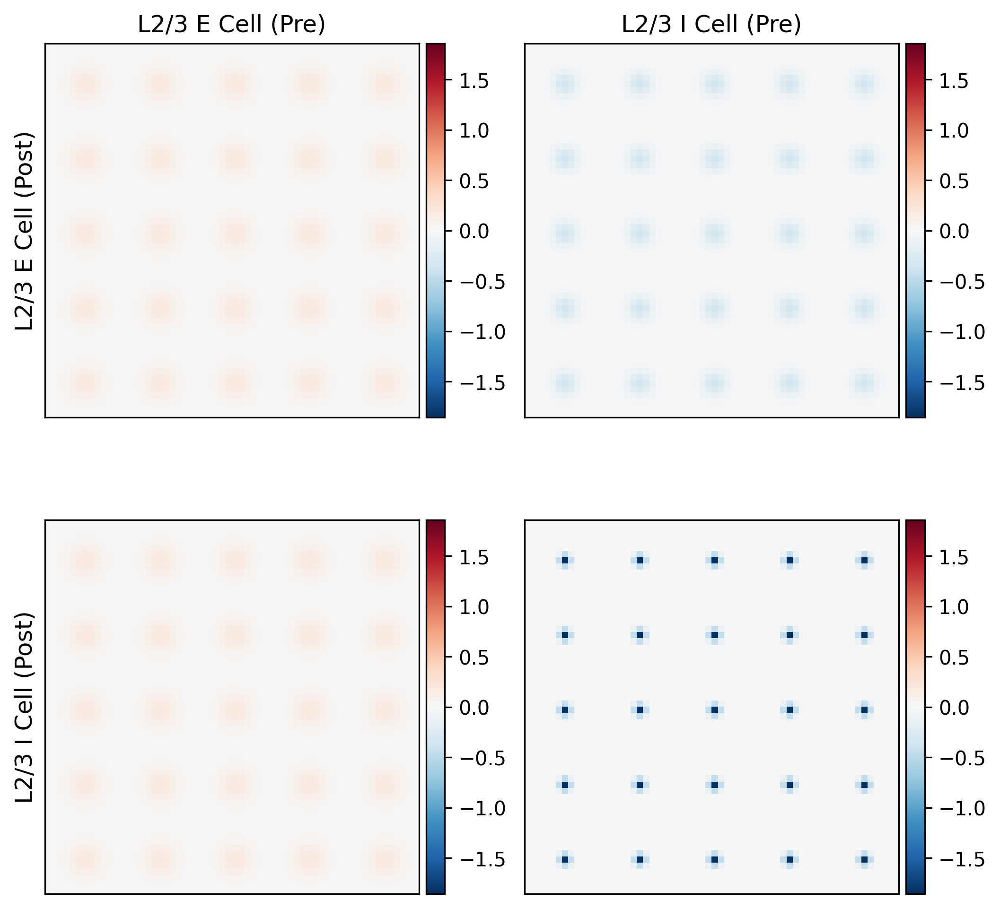

In [5]:
fig,axs = plt.subplots(2,2,figsize=(8,8),dpi=300)
fig.subplots_adjust(hspace=.2, wspace=.2)

WEE = np.zeros((N4,N4))
WEI = np.zeros((N4,N4))
WIE = np.zeros((N4,N4))
WII = np.zeros((N4,N4))

idxs = np.arange(N4//10,N4,N4//5)
for i in range(len(idxs)):
    for j in range(len(idxs)):
        rav_idx = np.ravel_multi_index([[idxs[i]],[idxs[j]]],(N4,N4))
        WEE += Whomo[:N4**2,:N4**2][:,rav_idx].reshape(N4,N4)
        WEI += Whomo[:N4**2,N4**2:][:,rav_idx].reshape(N4,N4)
        WIE += Whomo[N4**2:,:N4**2][:,rav_idx].reshape(N4,N4)
        WII += Whomo[N4**2:,N4**2:][:,rav_idx].reshape(N4,N4)

pf.imshowbar(fig,axs[0,0],WEE,
            vmin=-np.max(np.abs(Whomo)),vmax=np.max(np.abs(Whomo)),cmap='RdBu_r')
pf.imshowbar(fig,axs[0,1],WEI,
            vmin=-np.max(np.abs(Whomo)),vmax=np.max(np.abs(Whomo)),cmap='RdBu_r')
pf.imshowbar(fig,axs[1,0],WIE,
            vmin=-np.max(np.abs(Whomo)),vmax=np.max(np.abs(Whomo)),cmap='RdBu_r')
pf.imshowbar(fig,axs[1,1],WII,
            vmin=-np.max(np.abs(Whomo)),vmax=np.max(np.abs(Whomo)),cmap='RdBu_r')

axs[0,0].set_ylabel('L2/3 E Cell (Post)',fontsize=12)
axs[1,0].set_ylabel('L2/3 I Cell (Post)',fontsize=12)
axs[0,0].set_title('L2/3 E Cell (Pre)',fontsize=12)
axs[0,1].set_title('L2/3 I Cell (Pre)',fontsize=12)

# eigval,eigvec = sparse.linalg.eigs(Whomo,1,which='LR')
# print(eigval)

# Simulate dynamics with white-noise inputs

Text(0.5, 1.0, 'Noise Strength')

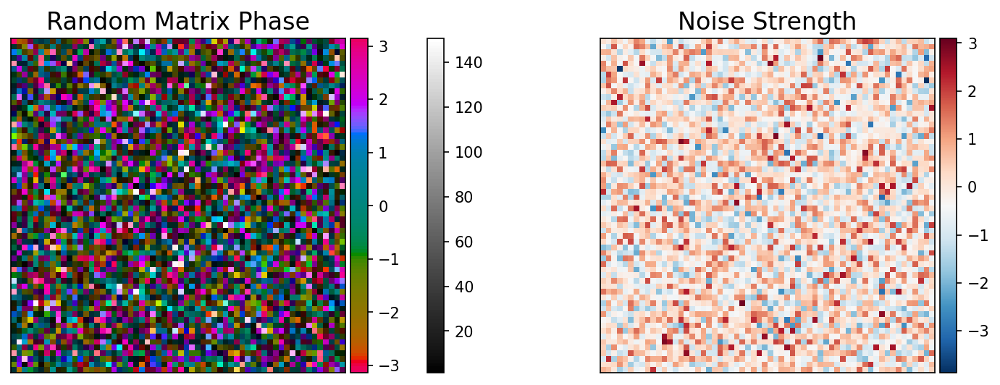

In [6]:
reload(gen_gaussian_random_field)

fig,axs = plt.subplots(1,2,figsize=(12,4),dpi=150)

# ring_image = np.fft.fftshift(gen_gaussian_random_field.generate_ring(N4,N4,0,N4/4))
random_matrix = np.fft.fft2(np.random.default_rng(0).normal(size=(N4,N4)))
# random_matrix = np.exp(-1j * np.angle(np.fft.fft2(np.random.randn(N4,N4))))
# ring_ifft = np.real(np.fft.ifft2(ring_image*random_matrix))
ring_ifft = np.real(np.fft.ifft2(random_matrix))
ring_ifft = ring_ifft - np.mean(ring_ifft)
ring_ifft = ring_ifft/np.std(ring_ifft)

# pf.imshowbar(fig,axs[0],ring_image,cmap='viridis')
pf.domcolbar(fig,axs[0],random_matrix)
pf.imshowbar(fig,axs[1],ring_ifft,cmap='RdBu_r')

axs[0].set_title('Random Matrix Phase',fontsize=16)
axs[1].set_title('Noise Strength',fontsize=16)

In [7]:
n_inp = 100
eta = 1e-2
inps = np.zeros((n_inp,2,N4,N4))

# ring_image = np.fft.fftshift(gen_gaussian_random_field.generate_ring(N4,N4,0,N4/4))

rng = np.random.default_rng(0)
for inp_idx in range(n_inp):
    for pop_idx in range(2):
        random_matrix = np.fft.fft2(rng.normal(size=(N4,N4)))
#         ring_ifft = np.real(np.fft.ifft2(ring_image*random_matrix))
        ring_ifft = np.real(np.fft.ifft2(random_matrix))
        ring_ifft = ring_ifft - np.mean(ring_ifft)
        ring_ifft = ring_ifft/np.std(ring_ifft)
        inps[inp_idx,pop_idx,:,:] = 1 + eta*ring_ifft

In [8]:
# rates = np.zeros_like(inps)

# start = time.process_time()

# for inp_idx in range(n_inp):
#     rates[inp_idx] = integrate(np.ones(2*N4**2),inps[inp_idx].reshape((2,-1)),0.25,100,Whomo)
    
# print('Simulating rate dynamics took',time.process_time() - start,'s')
# np.save('homo_rates_N4={:d}'.format(N4),rates.flatten())

rates = np.load('homo_rates_N4={:d}.npy'.format(N4)).reshape((n_inp,2,N4,N4))

In [9]:
n_row = 5

fig,axs = plt.subplots(n_row,2*n_row+1,figsize=((2*n_row+1)*10,n_row*10),dpi=150)

for i in range(n_row):
    axs[i,n_row].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        pf.imshowbar(fig,axs[i,j],
                     rates[idx,0],cmap='RdBu_r',
                     vmin=np.min(rates[:,0]),vmax=np.max(rates[:,0]))
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     rates[idx,1],cmap='RdBu_r',
                     vmin=np.min(rates[:,1]),vmax=np.max(rates[:,1]))

# Calculate the typical length scale

In [10]:
n_row = 5

fig,axs = plt.subplots(n_row,2*n_row+1,figsize=((2*n_row+1)*10,n_row*10),dpi=150)

for i in range(n_row):
    axs[i,n_row].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        pf.imshowbar(fig,axs[i,j],
                     np.abs(np.fft.fftshift(np.fft.fft2(rates[idx,0]-np.nanmean(rates[idx,0]))))**2,
                     cmap='binary')
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     np.abs(np.fft.fftshift(np.fft.fft2(rates[idx,1]-np.nanmean(rates[idx,1]))))**2,
                     cmap='binary')

In [11]:
# fps_dat = np.zeros(int(np.ceil(N4//2*np.sqrt(2))))
# fps_err = np.zeros(int(np.ceil(N4//2*np.sqrt(2))))
fps_dat = np.zeros(N4//2)
fps_err = np.zeros(N4//2)

grid = np.arange(-N4//2,N4//2)
x,y = np.meshgrid(grid,grid)
bin_idxs = np.digitize(np.sqrt(x**2+y**2),np.arange(0,np.ceil(N4//2*np.sqrt(2)))+0.5)

for i in range(10):
    for j in range(10):
        idx = i*10+j
        
        fp2 = np.abs(np.fft.fftshift(np.fft.fft2(rates[idx,0]-np.nanmean(rates[idx,0]))))**2
        for idx in range(N4//2):
            fps_dat[idx] += np.mean(fp2[bin_idxs == idx])
            fps_err[idx] += np.var(fp2[bin_idxs == idx])
            
        fp2 = np.abs(np.fft.fftshift(np.fft.fft2(rates[idx,1]-np.nanmean(rates[idx,1]))))**2
        for idx in range(N4//2):
            fps_dat[idx] += np.mean(fp2[bin_idxs == idx])
            fps_err[idx] += np.var(fp2[bin_idxs == idx])

fps_dat /= 2*n_inp
fps_err /= 2*n_inp
fps_err = np.sqrt(fps_err / (2*n_inp))
# fps_dat /= n_inp
# fps_err /= n_inp
# fps_err = np.sqrt(fps_err / n_inp)

(0.0, 26.95423177338127)

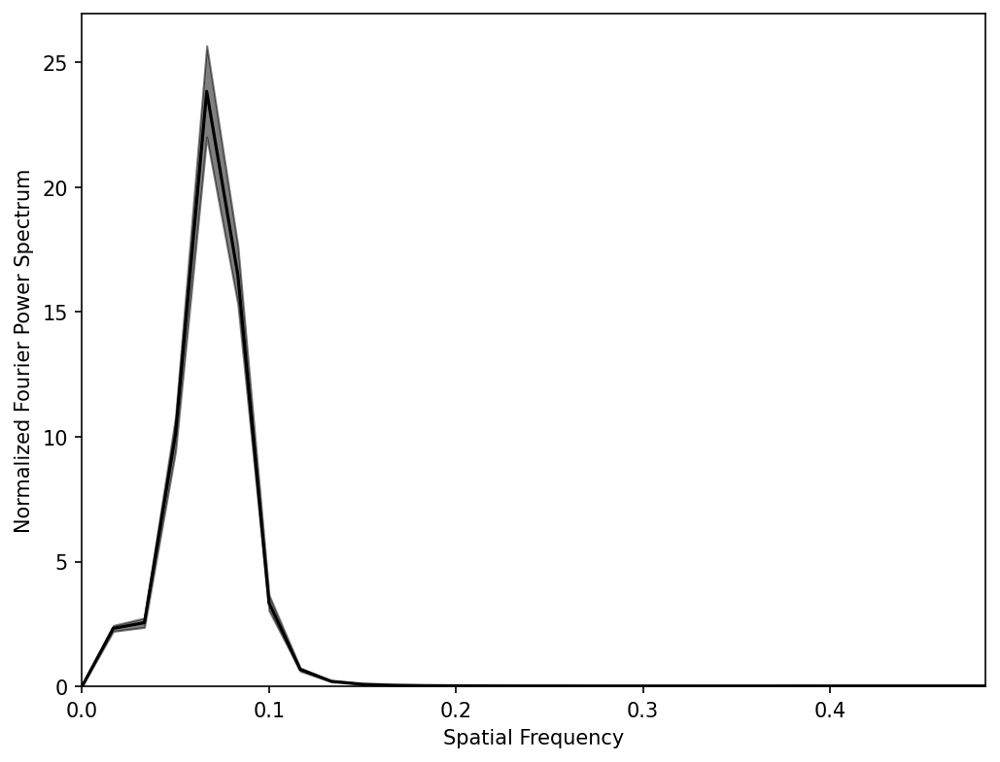

In [12]:
fig,axs = plt.subplots(1,1,figsize=(8,6),dpi=150)

# freqs = np.arange(int(np.ceil(N4//2*np.sqrt(2))))/N4
freqs = np.arange(N4//2)/N4

axs.plot(freqs,fps_dat/np.sum(fps_dat)*N4,'k')
axs.fill_between(freqs,(fps_dat+fps_err)/np.sum(fps_dat)*N4,
                 (fps_dat-fps_err)/np.sum(fps_dat)*N4,
                 color='k',alpha=0.5)

axs.set_xlabel('Spatial Frequency')
axs.set_ylabel('Normalized Fourier Power Spectrum')

axs.set_xlim(0,(N4//2-1)/N4)
axs.set_ylim(0,None)

In [13]:
Lam = 1/freqs[np.argmax(fps_dat)]
print('Λ =',Lam)

Λ = 15.0


# Construct heterogeneous recurrent weights

In [14]:
config_name = "big_hetero"
Version = -1
config_dict,N4pop,Nlgnpop,Nret,Nlgn,N4,rA = uf.get_network_size(config_name,verbose=False)
    
# W4 = connectivity.Connectivity_2pop((N4,N4),(N4,N4),\
#                                     (N4,N4), (N4,N4),\
#                                     random_seed=config_dict["random_seed"],\
#                                     Nvert=1, verbose=True)

# start = time.process_time()

# Whtro,arbor4to4 = W4.create_matrix_2pop(config_dict["W4to4_params"],config_dict["W4to4_params"]["Wrec_mode"])

# print('Creating heterogeneous recurrent connectivity took',time.process_time() - start,'s')
# np.save('hetero_W4to4_N4={:d}'.format(N4),Whtro)

Whtro = np.load('hetero_W4to4_N4={:d}.npy'.format(N4))

Text(0.5, 1.0, 'L2/3 I Cell (Pre)')

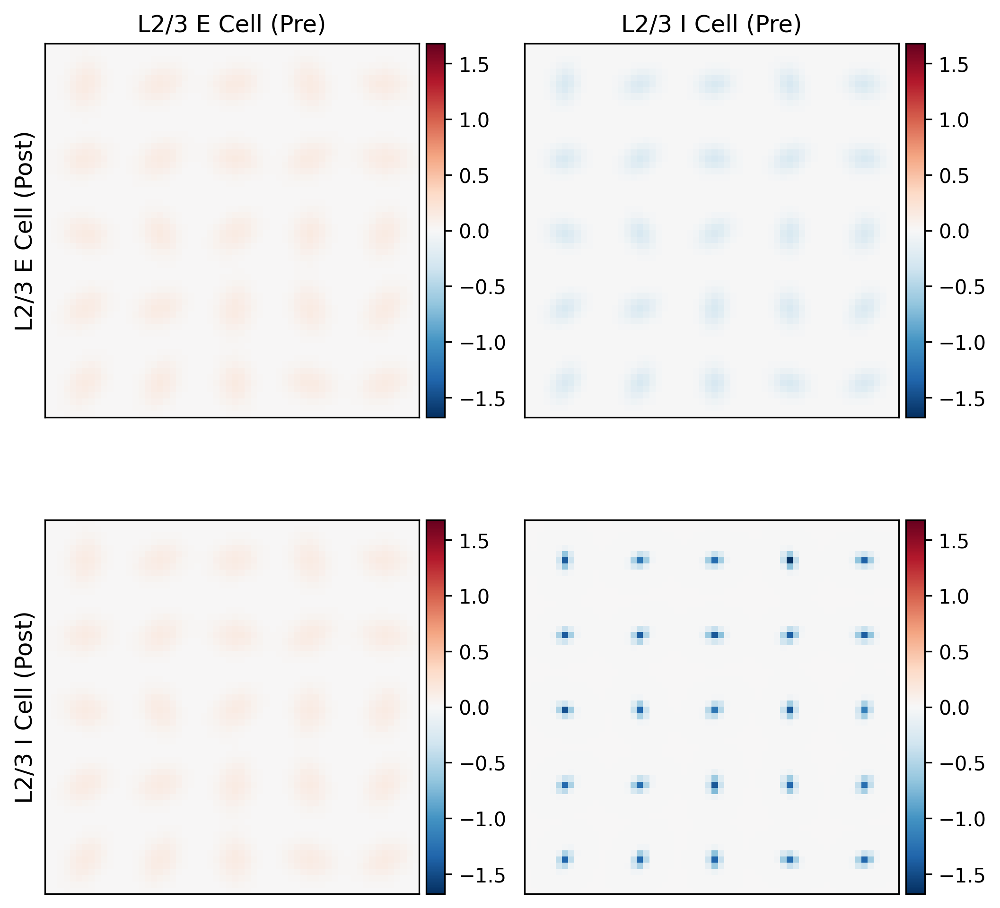

In [15]:
fig,axs = plt.subplots(2,2,figsize=(8,8),dpi=300)
fig.subplots_adjust(hspace=.2, wspace=.2)

WEE = np.zeros((N4,N4))
WEI = np.zeros((N4,N4))
WIE = np.zeros((N4,N4))
WII = np.zeros((N4,N4))

idxs = np.arange(N4//10,N4,N4//5)
for i in range(len(idxs)):
    for j in range(len(idxs)):
        rav_idx = np.ravel_multi_index([[idxs[i]],[idxs[j]]],(N4,N4))
        WEE += Whtro[:N4**2,:N4**2][:,rav_idx].reshape(N4,N4)
        WEI += Whtro[:N4**2,N4**2:][:,rav_idx].reshape(N4,N4)
        WIE += Whtro[N4**2:,:N4**2][:,rav_idx].reshape(N4,N4)
        WII += Whtro[N4**2:,N4**2:][:,rav_idx].reshape(N4,N4)

pf.imshowbar(fig,axs[0,0],WEE,
            vmin=-np.max(np.abs(Whtro)),vmax=np.max(np.abs(Whtro)),cmap='RdBu_r')
pf.imshowbar(fig,axs[0,1],WEI,
            vmin=-np.max(np.abs(Whtro)),vmax=np.max(np.abs(Whtro)),cmap='RdBu_r')
pf.imshowbar(fig,axs[1,0],WIE,
            vmin=-np.max(np.abs(Whtro)),vmax=np.max(np.abs(Whtro)),cmap='RdBu_r')
pf.imshowbar(fig,axs[1,1],WII,
            vmin=-np.max(np.abs(Whtro)),vmax=np.max(np.abs(Whtro)),cmap='RdBu_r')

axs[0,0].set_ylabel('L2/3 E Cell (Post)',fontsize=12)
axs[1,0].set_ylabel('L2/3 I Cell (Post)',fontsize=12)
axs[0,0].set_title('L2/3 E Cell (Pre)',fontsize=12)
axs[0,1].set_title('L2/3 I Cell (Pre)',fontsize=12)

# eigval,eigvec = sparse.linalg.eigs(Whtro,1,which='LR')
# print(eigval)

# Simulate network with band-passed inputs around typical length scale

In [16]:
print('Λ/L =',Lam/N4)

Λ/L = 0.25


In [33]:
x,y = np.meshgrid(np.linspace(-N4//2,N4//2-1,N4),np.linspace(-N4//2,N4//2-1,N4))
sig1 = 1.8
sig2 = 3.6
kern1 = 1./(np.sqrt(np.pi*2)*sig1)**2*np.exp((-x**2-y**2)/2./sig1**2)
kern2 = 1./(np.sqrt(np.pi*2)*sig2)**2*np.exp((-x**2-y**2)/2./sig2**2)
diff_gauss = kern1-kern2

Text(0.5, 1.0, 'Noise Strength')

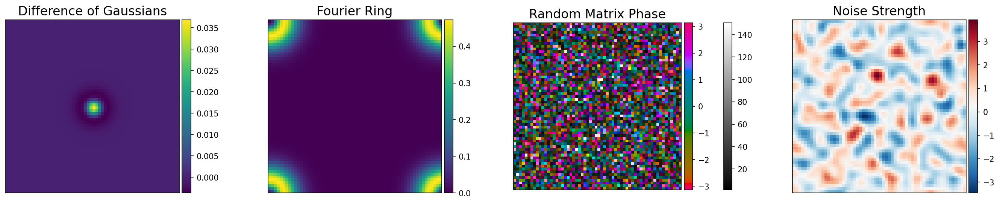

In [36]:
reload(gen_gaussian_random_field)

fig,axs = plt.subplots(1,4,figsize=(23,4),dpi=150)

# ring_image = np.fft.fftshift(gen_gaussian_random_field.generate_ring(N4,N4,1/(Lam/N4),N4/60))
ring_image = np.fft.fft2(np.fft.fftshift(diff_gauss))
random_matrix = np.fft.fft2(np.random.default_rng(0).normal(size=(N4,N4)))
# random_matrix = np.exp(-1j * np.angle(np.fft.fft2(np.random.randn(N4,N4))))
ring_ifft = np.real(np.fft.ifft2(ring_image*random_matrix))
ring_ifft = ring_ifft - np.mean(ring_ifft)
ring_ifft = ring_ifft/np.std(ring_ifft)

pf.imshowbar(fig,axs[0],diff_gauss,cmap='viridis')
pf.imshowbar(fig,axs[1],np.real(ring_image),cmap='viridis')
pf.domcolbar(fig,axs[2],random_matrix)
pf.imshowbar(fig,axs[3],ring_ifft,cmap='RdBu_r')

axs[0].set_title('Difference of Gaussians',fontsize=16)
axs[1].set_title('Fourier Ring',fontsize=16)
axs[2].set_title('Random Matrix Phase',fontsize=16)
axs[3].set_title('Noise Strength',fontsize=16)

In [18]:
n_inp = 100
eta = 1e-2
inps = np.zeros((n_inp,2,N4,N4))

ring_image = np.fft.fftshift(gen_gaussian_random_field.generate_ring(N4,N4,1/(Lam/N4),N4/60))

rng = np.random.default_rng(0)
for inp_idx in range(n_inp):
    for pop_idx in range(2):
        random_matrix = np.fft.fft2(rng.normal(size=(N4,N4)))
        ring_ifft = np.real(np.fft.ifft2(ring_image*random_matrix))
        ring_ifft = ring_ifft - np.mean(ring_ifft)
        ring_ifft = ring_ifft/np.std(ring_ifft)
        inps[inp_idx,pop_idx,:,:] = 1 + eta*ring_ifft

In [19]:
# rates = np.zeros_like(inps)

# start = time.process_time()

# for inp_idx in range(n_inp):
#     rates[inp_idx] = integrate(np.ones(2*N4**2),inps[inp_idx].reshape((2,-1)),0.25,100,Whtro)
    
# print('Simulating rate dynamics took',time.process_time() - start,'s')
# np.save('hetero_rates_N4={:d}'.format(N4),rates.flatten())

rates = np.load('hetero_rates_N4={:d}.npy'.format(N4)).reshape((n_inp,2,N4,N4))

In [20]:
n_row = 5

fig,axs = plt.subplots(n_row,2*n_row+1,figsize=((2*n_row+1)*10,n_row*10),dpi=150)

for i in range(n_row):
    axs[i,n_row].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        pf.imshowbar(fig,axs[i,j],
                     rates[idx,0],cmap='RdBu_r',
                     vmin=np.min(rates[:,0]),vmax=np.max(rates[:,0]))
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     rates[idx,1],cmap='RdBu_r',
                     vmin=np.min(rates[:,1]),vmax=np.max(rates[:,1]))

# Compare input power spectrum with rate power spectrum

In [21]:
n_row = 5

fig,axs = plt.subplots(n_row,2*n_row+1,figsize=((2*n_row+1)*10,n_row*10),dpi=150)

for i in range(n_row):
    axs[i,n_row].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        pf.imshowbar(fig,axs[i,j],
                     np.abs(np.fft.fftshift(np.fft.fft2(rates[idx,0]-np.nanmean(rates[idx,0]))))**2,
                     cmap='binary')
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     np.abs(np.fft.fftshift(np.fft.fft2(rates[idx,1]-np.nanmean(rates[idx,1]))))**2,
                     cmap='binary')

In [22]:
# inp_fps_dat = np.zeros(int(np.ceil(N4//2*np.sqrt(2))))
# inp_fps_err = np.zeros(int(np.ceil(N4//2*np.sqrt(2))))
# rate_fps_dat = np.zeros(int(np.ceil(N4//2*np.sqrt(2))))
# rate_fps_err = np.zeros(int(np.ceil(N4//2*np.sqrt(2))))
inp_fps_dat = np.zeros(N4//2)
inp_fps_err = np.zeros(N4//2)
rate_fps_dat = np.zeros(N4//2)
rate_fps_err = np.zeros(N4//2)

grid = np.arange(-N4//2,N4//2)
x,y = np.meshgrid(grid,grid)
bin_idxs = np.digitize(np.sqrt(x**2+y**2),np.arange(0,np.ceil(N4//2*np.sqrt(2)))+0.1)

for i in range(10):
    for j in range(10):
        idx = i*10+j
        
        fp2 = np.abs(np.fft.fftshift(np.fft.fft2(inps[idx,0]-np.nanmean(inps[idx,0]))))**2
        for idx in range(N4//2):
            inp_fps_dat[idx] += np.mean(fp2[bin_idxs == idx])
            inp_fps_err[idx] += np.var(fp2[bin_idxs == idx])
            
        fp2 = np.abs(np.fft.fftshift(np.fft.fft2(inps[idx,1]-np.nanmean(inps[idx,1]))))**2
        for idx in range(N4//2):
            inp_fps_dat[idx] += np.mean(fp2[bin_idxs == idx])
            inp_fps_err[idx] += np.var(fp2[bin_idxs == idx])
        
        fp2 = np.abs(np.fft.fftshift(np.fft.fft2(rates[idx,0]-np.nanmean(rates[idx,0]))))**2
        for idx in range(N4//2):
            rate_fps_dat[idx] += np.mean(fp2[bin_idxs == idx])
            rate_fps_err[idx] += np.var(fp2[bin_idxs == idx])
            
        fp2 = np.abs(np.fft.fftshift(np.fft.fft2(rates[idx,1]-np.nanmean(rates[idx,1]))))**2
        for idx in range(N4//2):
            rate_fps_dat[idx] += np.mean(fp2[bin_idxs == idx])
            rate_fps_err[idx] += np.var(fp2[bin_idxs == idx])

inp_fps_dat /= 2*n_inp
inp_fps_err /= 2*n_inp
inp_fps_err = np.sqrt(inp_fps_err / (2*n_inp))
rate_fps_dat /= 2*n_inp
rate_fps_err /= 2*n_inp
rate_fps_err = np.sqrt(rate_fps_err / (2*n_inp))

(0.0, 48.53607430415887)

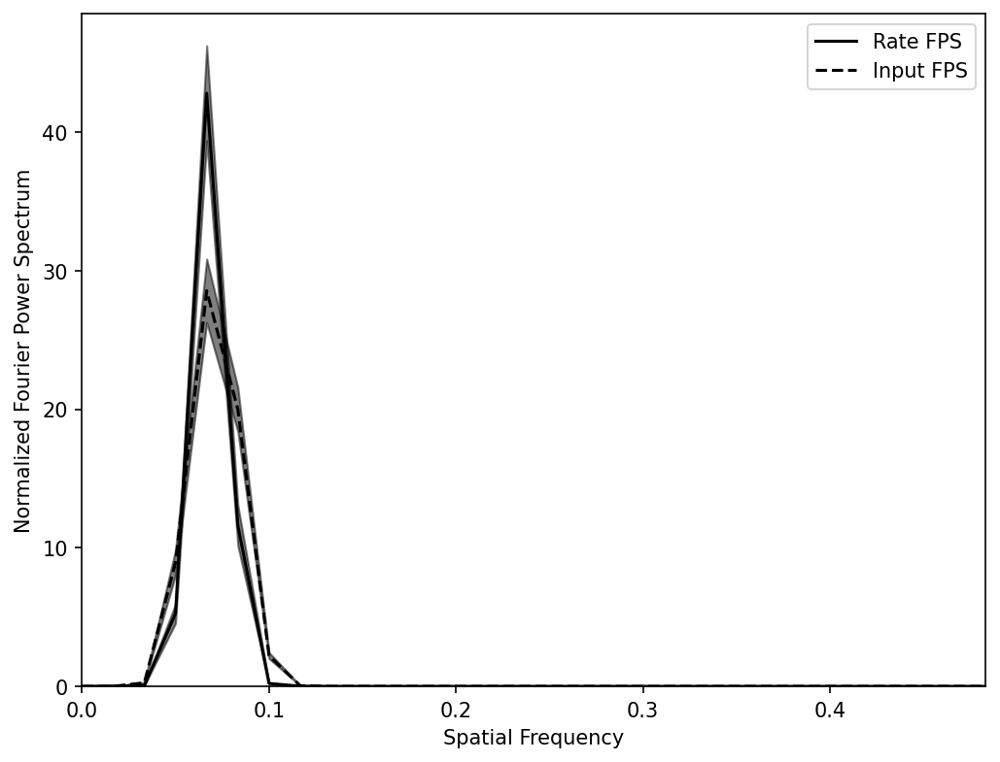

In [23]:
fig,axs = plt.subplots(1,1,figsize=(8,6),dpi=150)

freqs = np.arange(N4//2)/N4

axs.plot(freqs,rate_fps_dat/np.sum(rate_fps_dat)*N4,'k',label='Rate FPS')
axs.fill_between(freqs,(rate_fps_dat+rate_fps_err)/np.sum(rate_fps_dat)*N4,
                 (rate_fps_dat-rate_fps_err)/np.sum(rate_fps_dat)*N4,
                 color='k',alpha=0.5)
axs.plot(freqs,inp_fps_dat/np.sum(inp_fps_dat)*N4,'k--',label='Input FPS')
axs.fill_between(freqs,(inp_fps_dat+inp_fps_err)/np.sum(inp_fps_dat)*N4,
                 (inp_fps_dat-inp_fps_err)/np.sum(inp_fps_dat)*N4,
                 color='k',alpha=0.5)
axs.legend()

axs.set_xlabel('Spatial Frequency')
axs.set_ylabel('Normalized Fourier Power Spectrum')

axs.set_xlim(0,(N4//2-1)/N4)
axs.set_ylim(0,None)

In [24]:
print(1/freqs[np.argmax(rate_fps_dat)])

15.0


# Calculate correlation patterns

In [25]:
rates_zsc = rates[:,0] - np.mean(rates[:,0],0)
rates_zsc = rates_zsc / np.std(rates[:,0],0)

start = time.process_time()

# rates_cov = np.einsum('ijk,ilm->jklm',rates_sub,rates_sub) / n_inp
# rates_corr = rates_cov/(rates_std[:,:,None,None]*rates_std[None,None,:,:])
rates_corr = np.einsum('ijk,ilm->jklm',rates_zsc,rates_zsc) / n_inp

print('Calculating correlation patterns took',time.process_time() - start,'s')

Calculating correlation patterns took 1.1247129999999856 s


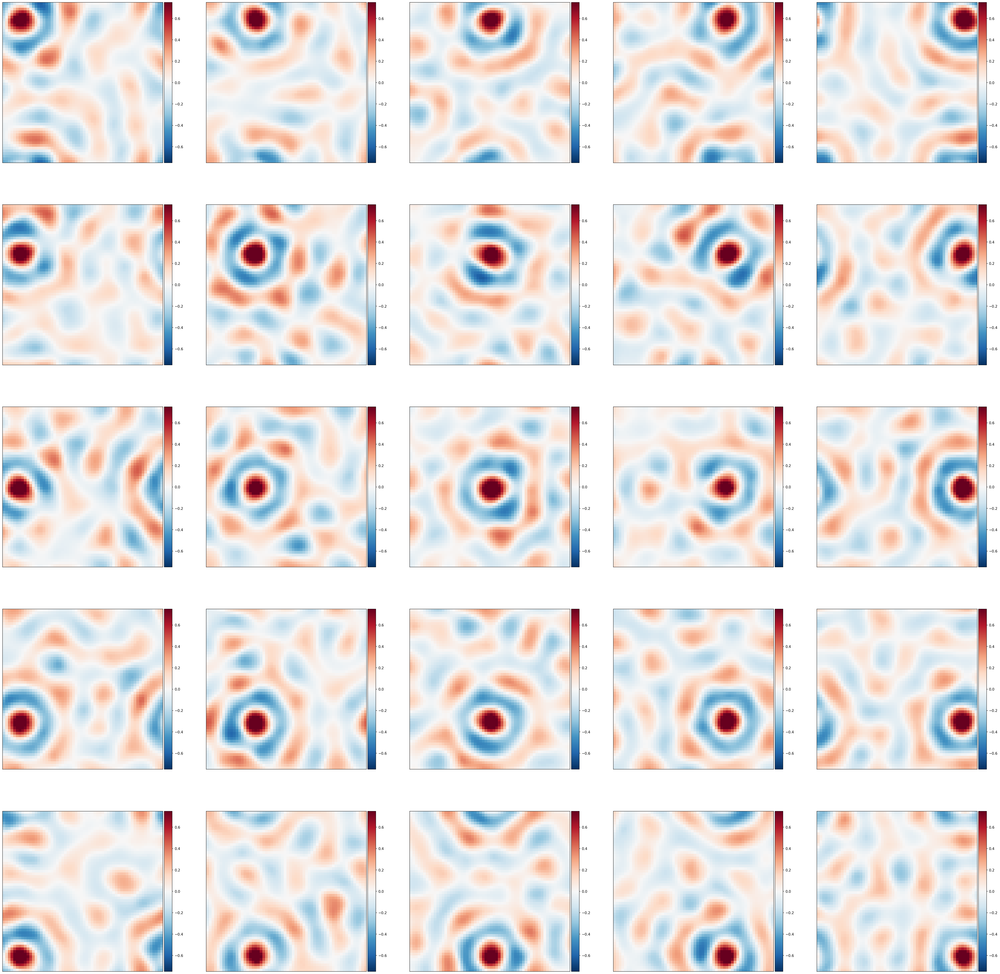

In [26]:
n_row = 5

fig,axs = plt.subplots(n_row,n_row,figsize=(n_row*10,n_row*10),dpi=150)

idxs = np.arange(N4//(2*n_row),N4,N4//n_row)
for i in range(n_row):
    for j in range(n_row):
        seed_idx = (idxs[i],idxs[j])
        corr_patt = rates_corr[seed_idx[0],seed_idx[1],:,:]
        pf.imshowbar(fig,axs[i,j],corr_patt,cmap='RdBu_r',vmin=-0.75,vmax=0.75)

## Calculate dimensionality

In [28]:
rates_cov = rates_corr*np.std(rates[:,0],0)[:,:,None,None]*np.std(rates[:,0],0)[None,None,:,:]
rates_cov_mat = rates_cov.reshape((N4**2,N4**2))
w = np.linalg.eigvalsh(rates_cov_mat)

# print('Dimensionality =',np.trace(rates_cov_mat)**2/np.trace(rates_cov_mat@rates_cov_mat))
print('Dimensionality =',np.sum(w)**2/np.sum(w**2))

Dimensionality = 30.59363987842458


# Calculate Fracture Lines

In [34]:
C_zsc = rates_corr - np.mean(rates_corr,(2,3))[:,:,None,None]
C_zsc = C_zsc / np.std(rates_corr,(2,3))[:,:,None,None]

C_px = np.roll(C_zsc,-1,0)
C_mx = np.roll(C_zsc, 1,0)
C_py = np.roll(C_zsc,-1,1)
C_my = np.roll(C_zsc, 1,1)

start = time.process_time()

# C_corr_x = np.einsum('ijab,ijab->ij',C_px,C_mx) / (N4**2)
# C_corr_y = np.einsum('ijab,ijab->ij',C_py,C_my) / (N4**2)
C_corr_x = np.einsum('ijab,ijab->ij',C_px,C_zsc) / (N4**2)
C_corr_y = np.einsum('ijab,ijab->ij',C_py,C_zsc) / (N4**2)

print('Calculating correlation difference patterns took',time.process_time() - start,'s')

Calculating correlation difference patterns took 0.03716299999999251 s


In [35]:
from skimage.morphology import medial_axis,skeletonize

In [43]:
# F_x = (1-C_corr_x) / 2
# F_y = (1-C_corr_y) / 2
F_x = (1-C_corr_x) / 1
F_y = (1-C_corr_y) / 1

rates_frac = np.sqrt(F_x**2 + F_y**2)
frac_min = np.min(rates_frac)
frac_max = np.max(rates_frac)

def normalize(A):
    return (A-np.min(A))/(np.max(A)-np.min(A))

def integize(A,bits=16):
    if bits == 8:
        return (normalize(A)*255).astype(np.uint8)
    else:
        return (normalize(A)*65535).astype(np.uint16)

def wrap_pad(A,pad_len=1):
    old_shape = np.array(A.shape)
    new_shape = (old_shape + 2*pad_len*np.ones(2)).astype(int)
    new_A = np.zeros(new_shape,A.dtype)
    new_A[pad_len:-pad_len,pad_len:-pad_len] = A.copy()
    new_A[ :pad_len,pad_len:-pad_len] = A[-pad_len:,:].copy()
    new_A[-pad_len:,pad_len:-pad_len] = A[ :pad_len,:].copy()
    new_A[pad_len:-pad_len, :pad_len] = A[:,-pad_len:].copy()
    new_A[pad_len:-pad_len,-pad_len:] = A[:, :pad_len].copy()
    new_A[ :pad_len, :pad_len] = A[-pad_len:,-pad_len:].copy()
    new_A[-pad_len:, :pad_len] = A[ :pad_len,-pad_len:].copy()
    new_A[ :pad_len,-pad_len:] = A[-pad_len:, :pad_len].copy()
    new_A[-pad_len:,-pad_len:] = A[ :pad_len, :pad_len].copy()
    return new_A

def wrap_unpad(A,pad_len=1):
    return A[pad_len:-pad_len,pad_len:-pad_len].copy()

clahe = cv2.createCLAHE(clipLimit=20, tileGridSize=(10,10))
struct = np.ones((3,3))
for i in [0,-1]:
    for j in [0,-1]:
        struct[i,j] = 0
struct = struct.astype(np.uint8)

rates_frac_int = integize(rates_frac)
rates_frac_medfilt = integize(ndimage.median_filter(rates_frac_int,3,mode='wrap'))
rates_frac_clahe = integize(wrap_unpad(clahe.apply(wrap_pad(rates_frac_medfilt,8)),8))
rates_frac_bin = (rates_frac_clahe > 65535/2).astype(np.uint8)
rates_frac_erodil = rates_frac_bin.copy()

for i in range(2):
    rates_frac_erodil = wrap_unpad(cv2.erode(wrap_pad(rates_frac_erodil,8),struct),8)
    rates_frac_erodil = wrap_unpad(cv2.dilate(wrap_pad(rates_frac_erodil,8),struct),8)
    
rates_frac_skel = wrap_unpad(skeletonize(wrap_pad(rates_frac_erodil,8)),8).astype(np.uint8)
# rates_frac_skel,rates_frac_dists = medial_axis(wrap_pad(rates_frac_erodil,8),return_distance=True)
# rates_frac_skel = wrap_unpad(rates_frac_skel,8).astype(np.uint8)

Text(0.5, 1.0, 'Skeletonized Fracture Strength')

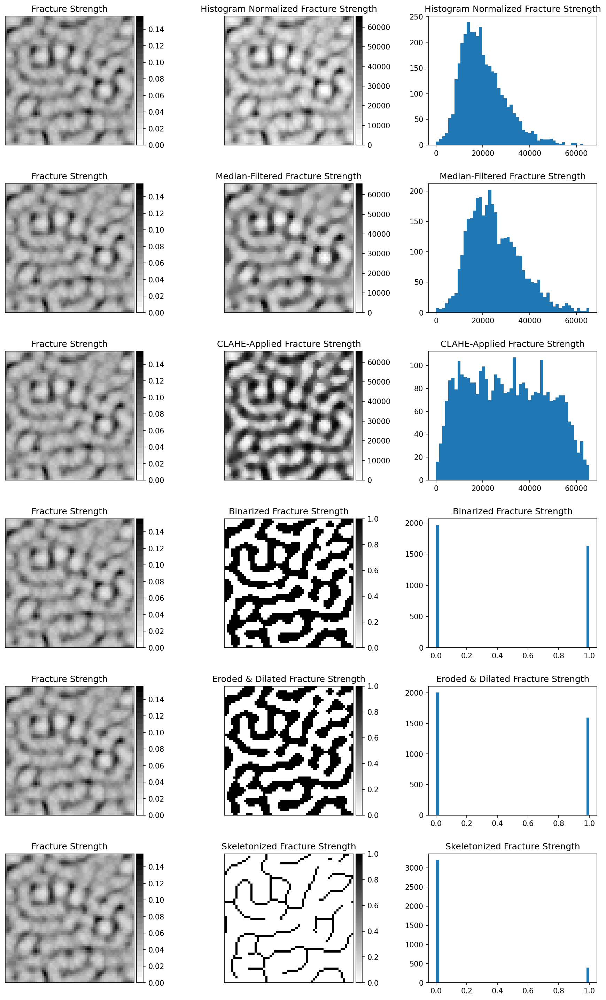

In [46]:
fig,axs = plt.subplots(6,3,figsize=(15,24),dpi=150)
fig.subplots_adjust(hspace=.3, wspace=.3)

bin_cmap = plt.get_cmap('binary', 24)
bin_cmap._init()
# bin_cmap._lut[:,-1] = np.concatenate((np.fmin(1.0,np.fmax(0.0,
#                             np.linspace(-1.0, 1.5, bin_cmap.N))),np.ones(3)))

pf.imshowbar(fig,axs[0,0],rates_frac,cmap=bin_cmap,vmin=0)
pf.imshowbar(fig,axs[0,1],rates_frac_int,cmap=bin_cmap,vmin=0)
axs[0,2].hist((rates_frac_int).flatten(),50)

pf.imshowbar(fig,axs[1,0],rates_frac,cmap=bin_cmap,vmin=0)
pf.imshowbar(fig,axs[1,1],rates_frac_medfilt,cmap='binary',vmin=0)
axs[1,2].hist((rates_frac_medfilt).flatten(),50)

pf.imshowbar(fig,axs[2,0],rates_frac,cmap=bin_cmap,vmin=0)
pf.imshowbar(fig,axs[2,1],rates_frac_clahe,cmap='binary',vmin=0)
axs[2,2].hist((rates_frac_clahe).flatten(),50)

pf.imshowbar(fig,axs[3,0],rates_frac,cmap=bin_cmap,vmin=0)
pf.imshowbar(fig,axs[3,1],rates_frac_bin,cmap='binary',vmin=0)
axs[3,2].hist((rates_frac_bin).flatten(),50)

pf.imshowbar(fig,axs[4,0],rates_frac,cmap=bin_cmap,vmin=0)
pf.imshowbar(fig,axs[4,1],rates_frac_erodil,cmap='binary',vmin=0)
axs[4,2].hist((rates_frac_erodil).flatten(),50)

pf.imshowbar(fig,axs[5,0],rates_frac,cmap=bin_cmap,vmin=0)
pf.imshowbar(fig,axs[5,1],rates_frac_skel,cmap='binary',vmin=0)
axs[5,2].hist((rates_frac_skel).flatten(),50)

axs[0,0].set_title('Fracture Strength'.format(i+1))
axs[0,1].set_title('Histogram Normalized Fracture Strength'.format(i+1))
axs[0,2].set_title('Histogram Normalized Fracture Strength'.format(i+1))

axs[1,0].set_title('Fracture Strength'.format(i+1))
axs[1,1].set_title('Median-Filtered Fracture Strength'.format(i+1))
axs[1,2].set_title('Median-Filtered Fracture Strength'.format(i+1))

axs[2,0].set_title('Fracture Strength'.format(i+1))
axs[2,1].set_title('CLAHE-Applied Fracture Strength'.format(i+1))
axs[2,2].set_title('CLAHE-Applied Fracture Strength'.format(i+1))

axs[3,0].set_title('Fracture Strength'.format(i+1))
axs[3,1].set_title('Binarized Fracture Strength'.format(i+1))
axs[3,2].set_title('Binarized Fracture Strength'.format(i+1))

axs[4,0].set_title('Fracture Strength'.format(i+1))
axs[4,1].set_title('Eroded & Dilated Fracture Strength'.format(i+1))
axs[4,2].set_title('Eroded & Dilated Fracture Strength'.format(i+1))

axs[5,0].set_title('Fracture Strength'.format(i+1))
axs[5,1].set_title('Skeletonized Fracture Strength'.format(i+1))
axs[5,2].set_title('Skeletonized Fracture Strength'.format(i+1))

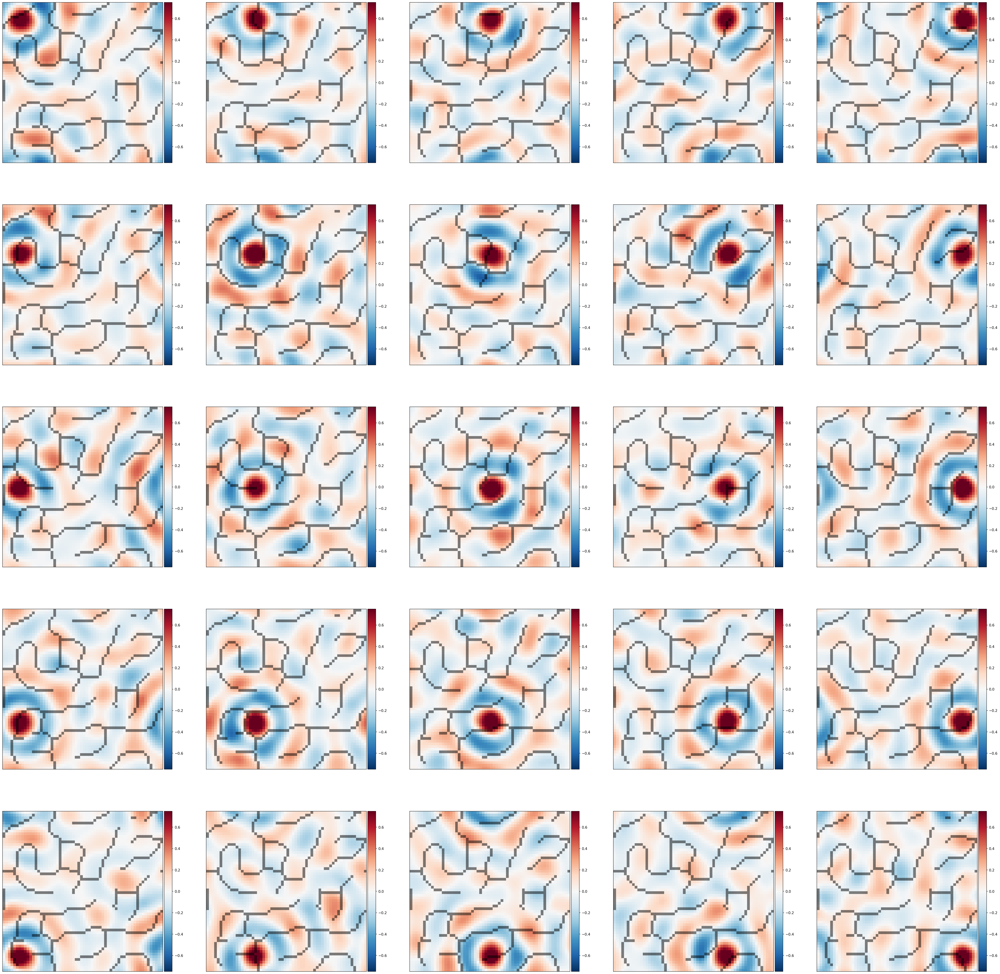

In [45]:
n_row = 5

fig,axs = plt.subplots(n_row,n_row,figsize=(n_row*10,n_row*10),dpi=150)

bin_cmap = plt.get_cmap('binary', 24)
bin_cmap._init()
bin_cmap._lut[:,-1] = np.concatenate((np.fmin(1.0,np.fmax(0.0,np.linspace(-1.0, 1.5, bin_cmap.N))),np.ones(3)))

idxs = np.arange(N4//(2*n_row),N4,N4//n_row)
for i in range(n_row):
    for j in range(n_row):
        seed_idx = (idxs[i],idxs[j])
        pf.imshowbar(fig,axs[i,j],rates_corr[seed_idx[0],seed_idx[1],:,:],cmap='RdBu_r',vmin=-0.75,vmax=0.75)
        axs[i,j].imshow(rates_frac_skel,cmap=bin_cmap,vmin=0,alpha=0.5)

# Investigate amplified directions

In [47]:
start = time.process_time()

chi_homo = np.linalg.inv(np.eye(2*N4**2)-1.02/0.95*Whomo)
chi_htro = np.linalg.inv(np.eye(2*N4**2)-1.02/0.95*Whtro)

print('Calculating input-output matrices took',time.process_time() - start,'s')

Calculating input-output matrices took 77.26294800000005 s


In [48]:
start = time.process_time()

# U_homo,S_homo,Vh_homo = np.linalg.svd(chi_homo)
U_htro,S_htro,Vh_htro = np.linalg.svd(chi_htro)

print('Calculating singular value decomps took',time.process_time() - start,'s')

Calculating singular value decomps took 526.013031 s


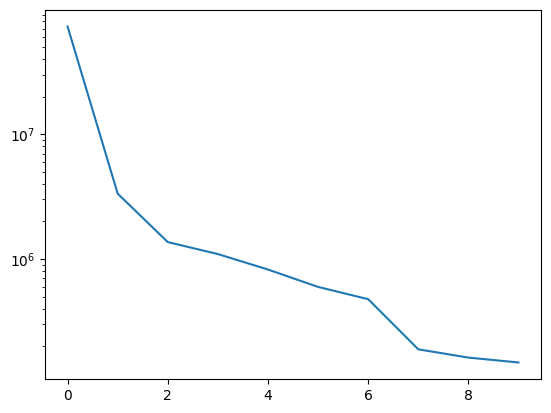

In [52]:
plt.plot(S_htro[:10]**2)
# plt.yscale('log')

## Plot right singular vectors (input patterns)

In [50]:
n_row = 3

fig,axs = plt.subplots(2*n_row+1,2*n_row+1,figsize=((2*n_row+1)*10,(2*n_row+1)*10),dpi=150)

axs[n_row,n_row].axis('off')

for i in range(n_row):
    axs[i,n_row].axis('off')
    axs[n_row+i+1,n_row].axis('off')
    axs[n_row,i].axis('off')
    axs[n_row,n_row+i+1].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        v_homo = Vh_homo[idx,:].reshape((2,N4,N4))
        v_htro = Vh_htro[idx,:].reshape((2,N4,N4))
        pf.imshowbar(fig,axs[i,j],
                     v_homo[0],cmap='RdBu_r',
                     vmin=-np.max(np.abs(v_homo[0])),vmax=np.max(np.abs(v_homo[0])))
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     v_homo[1],cmap='RdBu_r',
                     vmin=-np.max(np.abs(v_homo[1])),vmax=np.max(np.abs(v_homo[1])))
        pf.imshowbar(fig,axs[n_row+i+1,j],
                     v_htro[0],cmap='RdBu_r',
                     vmin=-np.max(np.abs(v_htro[0])),vmax=np.max(np.abs(v_htro[0])))
        pf.imshowbar(fig,axs[n_row+i+1,n_row+j+1],
                     v_htro[1],cmap='RdBu_r',
                     vmin=-np.max(np.abs(v_htro[1])),vmax=np.max(np.abs(v_htro[1])))

## Plot left singular vectors (output patterns)

In [51]:
n_row = 3

fig,axs = plt.subplots(2*n_row+1,2*n_row+1,figsize=((2*n_row+1)*10,(2*n_row+1)*10),dpi=150)

axs[n_row,n_row].axis('off')

for i in range(n_row):
    axs[i,n_row].axis('off')
    axs[n_row+i+1,n_row].axis('off')
    axs[n_row,i].axis('off')
    axs[n_row,n_row+i+1].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        u_homo = U_homo[:,idx].reshape((2,N4,N4))
        u_htro = U_htro[:,idx].reshape((2,N4,N4))
        pf.imshowbar(fig,axs[i,j],
                     u_homo[0],cmap='RdBu_r',
                     vmin=-np.max(np.abs(u_homo[0])),vmax=np.max(np.abs(u_homo[0])))
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     u_homo[1],cmap='RdBu_r',
                     vmin=-np.max(np.abs(u_homo[1])),vmax=np.max(np.abs(u_homo[1])))
        pf.imshowbar(fig,axs[n_row+i+1,j],
                     u_htro[0],cmap='RdBu_r',
                     vmin=-np.max(np.abs(u_htro[0])),vmax=np.max(np.abs(u_htro[0])))
        pf.imshowbar(fig,axs[n_row+i+1,n_row+j+1],
                     u_htro[1],cmap='RdBu_r',
                     vmin=-np.max(np.abs(u_htro[1])),vmax=np.max(np.abs(u_htro[1])))

## Compare to PC's of activity

In [70]:
from sklearn.decomposition import PCA

In [71]:
pca = PCA(n_components=50)
pca.fit(rates.reshape((-1,2*N4**2)))
print(pca.explained_variance_ratio_)
print(pca.singular_values_)

[0.05784885 0.05382049 0.05072433 0.04528506 0.04377908 0.04327685
 0.03974382 0.03889424 0.03520415 0.03281473 0.0313101  0.0303006
 0.0282429  0.0261813  0.02507296 0.02427834 0.02356143 0.02166879
 0.02066546 0.02030362 0.01849352 0.01777287 0.01672377 0.01559406
 0.01519165 0.01470349 0.01415584 0.01335855 0.01180845 0.01147034
 0.01104722 0.01088967 0.00982456 0.00909945 0.00872482 0.00795118
 0.00766973 0.0073145  0.00679548 0.00673625 0.00596183 0.00546083
 0.00494018 0.0047562  0.00396286 0.00359346 0.0031828  0.00311807
 0.00285594 0.00276061]
[39.91216311 38.49742862 37.37369478 35.31306028 34.72092046 34.52118592
 33.08207059 32.72657193 31.13542738 30.06023239 29.3629784  28.88574144
 27.88768985 26.8505672  26.27608498 25.85635796 25.4717439  24.42728376
 23.85505543 23.64528944 22.56668365 22.12262674 21.45976426 20.72227792
 20.45315852 20.12185769 19.74356944 19.17951284 18.03243149 17.77239995
 17.44152266 17.31670707 16.44804986 15.82943546 15.50015956 14.79699965
 14

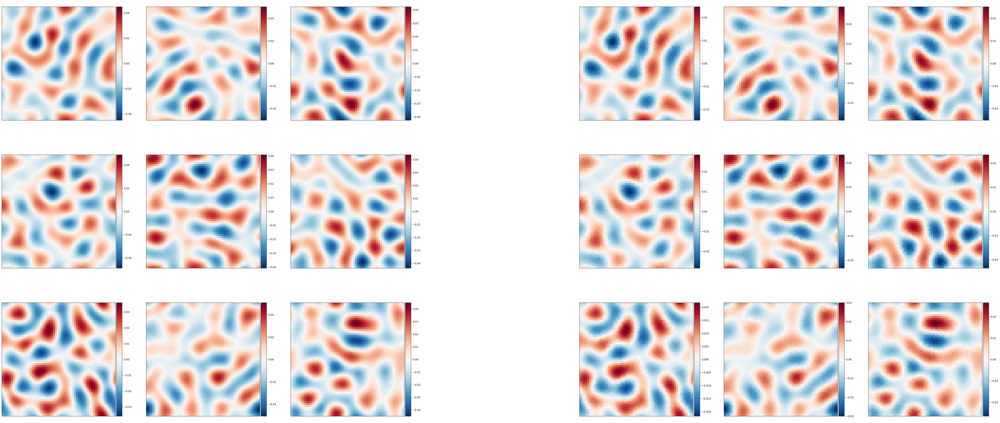

In [72]:
n_row = 3

fig,axs = plt.subplots(n_row,2*n_row+1,figsize=((2*n_row+1)*10,n_row*10),dpi=150)

for i in range(n_row):
    axs[i,n_row].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        pc = pca.components_[idx].reshape((2,N4,N4))
        pf.imshowbar(fig,axs[i,j],
                     pc[0],cmap='RdBu_r',
                     vmin=-np.max(np.abs(pc[0])),vmax=np.max(np.abs(pc[0])))
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     pc[1],cmap='RdBu_r',
                     vmin=-np.max(np.abs(pc[1])),vmax=np.max(np.abs(pc[1])))

Text(0, 0.5, 'Normalized Singular Values')

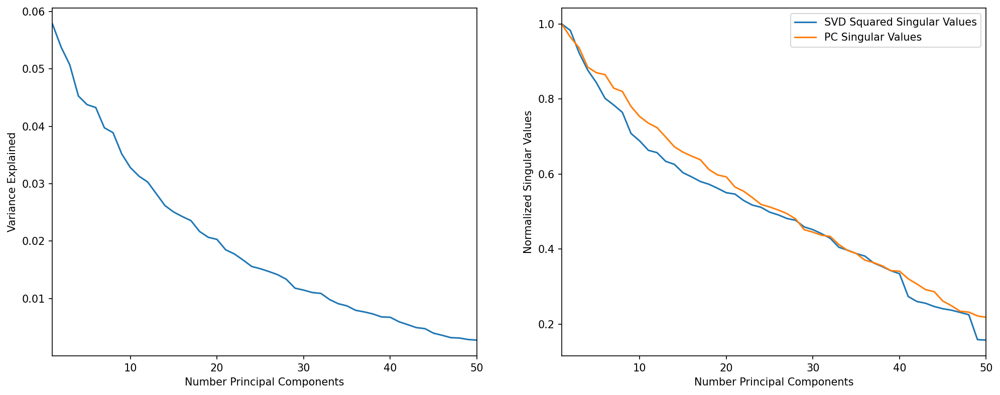

In [73]:
fig,axs = plt.subplots(1,2,figsize=(16,6),dpi=150)

axs[0].plot(np.arange(1,pca.n_components_+1),pca.explained_variance_ratio_)
axs[0].set_xlim(1,pca.n_components_)
# axs[0].set_yscale('log')
axs[0].set_xlabel('Number Principal Components')
axs[0].set_ylabel('Variance Explained')

axs[1].plot(np.arange(1,pca.n_components_+1),(S_htro**2)[:pca.n_components_]/((S_htro**2)[0]),
           label='SVD Squared Singular Values')
axs[1].plot(np.arange(1,pca.n_components_+1),pca.singular_values_[:pca.n_components_]/pca.singular_values_[0],
           label='PC Singular Values')
axs[1].legend()
axs[1].set_xlim(1,pca.n_components_)
axs[1].set_xlabel('Number Principal Components')
axs[1].set_ylabel('Normalized Singular Values')